In [24]:
# Import libraries
import pandas as pd
import seaborn as sns
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8) #Adjusts the configuration of the plots that will be created


# Read in the data

df = pd.read_csv(r'C:\Users\jaeja\Downloads\movies.csv')

In [6]:
# Looking at the data
# What kind of things impact the gross revenue of a film?

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [30]:
# Checking if there's missing data

pd.set_option('display.precision', 2)
for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing)) 
       
df.isnull().sum()

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [33]:
# For sake of time we will drop the rows that have missing data

df = df.dropna()
df.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [34]:
# Data types of columns

df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [37]:
# Changing columns datatype

df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')
df['votes'] = df['votes'].astype('int64')

In [38]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.40,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.00
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.80,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.00
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.70,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.00
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.70,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.00
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.30,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.60,140000,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.00
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.50,102000,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.00
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.60,53000,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.00
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.80,42000,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.00


In [40]:
# Creating correct Year column
# Using a RegEx expression to extract year from released column. It takes all numbers that appear in a sequence of 4

df['yearcorrect'] = df['released'].str.extract(pat = '([0-9]{4})').astype(int)

df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.40,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.00,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.80,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.00,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.70,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.00,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.70,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.00,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.30,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.00,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020 (United States)",6.60,140000,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.00,2020
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020 (United States)",6.50,102000,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.00,2020
7650,Dolittle,PG,Adventure,2020,"January 17, 2020 (United States)",5.60,53000,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.00,2020
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020 (United States)",6.80,42000,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.00,2020


In [78]:
df = df.sort_values(by=['gross'], inplace = False, ascending = False)

In [47]:
pd.set_option('display.max_rows', None)

In [51]:
# Drop duplicates if any

df.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.40,927000,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.00,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.80,65000,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.00,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.70,1200000,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.00,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.70,221000,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.00,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.30,108000,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.00,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.40,123000,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.00,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.90,188000,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.00,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.20,330000,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.00,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.80,101000,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.00,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.00,10000,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.00,1980


In [52]:
# Looking at unique companies to check quality of data

df['company'].drop_duplicates().sort_values(ascending = False)

7129                                              thefyzz
5664                                          micro_scope
4007                                             i5 Films
6793                                           i am OTHER
6420                                                 erbp
3776                                       double A Films
3330                          Zucker Brothers Productions
146                                      Zoetrope Studios
2213                                   Zeta Entertainment
3698                              Zentropa Entertainments
1180                                 Zenith Entertainment
5180                                      Zazen Produções
1321                             Zanuck/Brown Productions
1329                          Zacharias-Buhai Productions
789                             Young Sung Production Co.
5125                           Young Hannibal Productions
5499                                          Yellow Bird
4618          

In [53]:
# What aspects correlate the most towards gross revenue?

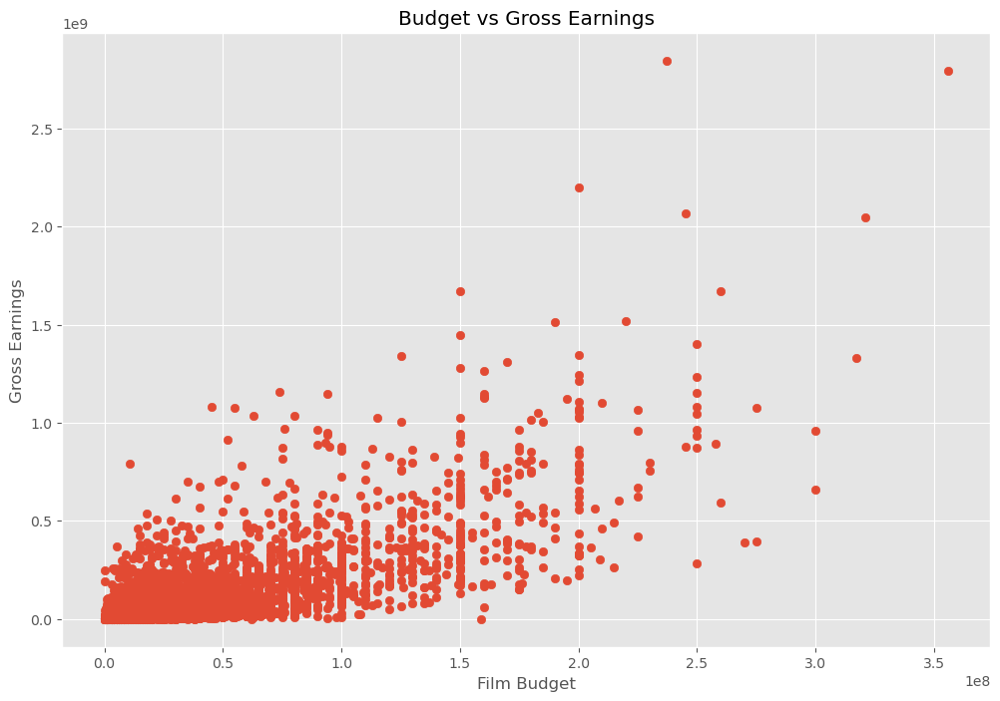

In [59]:
# Scatter plot-- Budget vs Gross Earnings

plt.scatter(x = df['budget'], y = df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Film Budget')
plt.ylabel('Gross Earnings')

plt.show()

In [57]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.80,1100000,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.00,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.40,903000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.00,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.80,1100000,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.00,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.80,876000,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.00,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.40,897000,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.00,2018


<AxesSubplot:xlabel='budget', ylabel='gross'>

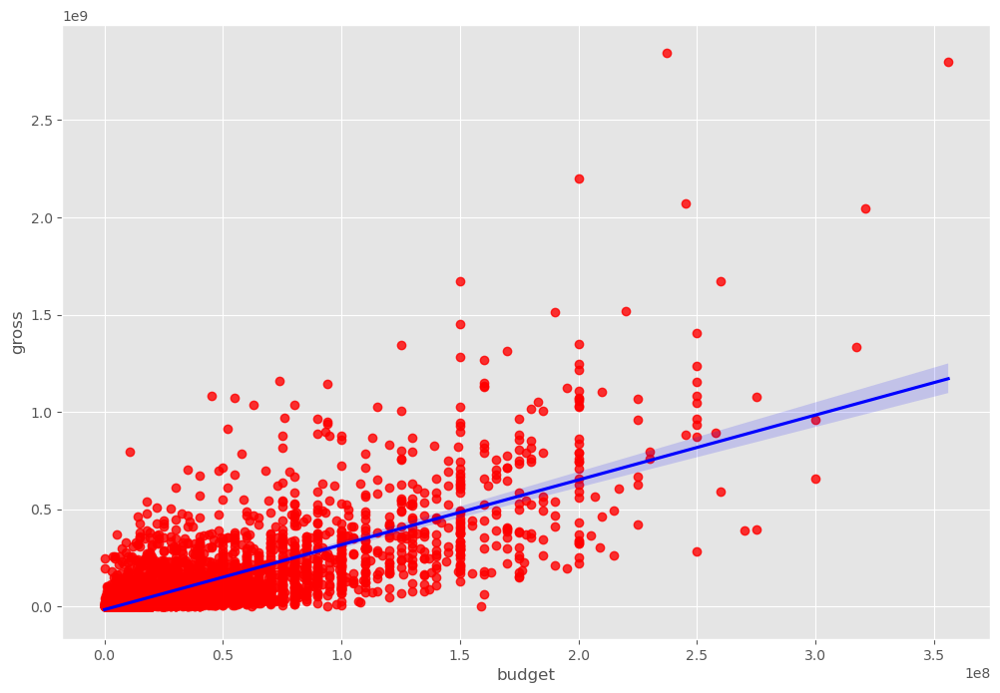

In [61]:
# Plot Budget vs Gross using seaborn

sns.regplot(x = 'budget', y = 'gross', data = df, scatter_kws = {"color": "red"}, line_kws = {"color":"blue"})

In [64]:
# Looking at correlation for numerical fields

df.corr() #pearson(default), kendall, spearman

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.00,0.06,0.21,0.33,0.27,0.08,1.00
score,0.06,1.00,0.47,0.07,0.22,0.41,0.06
votes,0.21,0.47,1.00,0.44,0.61,0.35,0.20
budget,0.33,0.07,0.44,1.00,0.74,0.32,0.32
gross,0.27,0.22,0.61,0.74,1.00,0.28,0.27
runtime,0.08,0.41,0.35,0.32,0.28,1.00,0.08
yearcorrect,1.00,0.06,0.20,0.32,0.27,0.08,1.00


In [65]:
df.corr(method = 'kendall')

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.00,0.04,0.30,0.22,0.24,0.06,0.99
score,0.04,1.00,0.35,-0.01,0.12,0.29,0.04
votes,0.30,0.35,1.00,0.35,0.55,0.21,0.29
budget,0.22,-0.01,0.35,1.00,0.51,0.23,0.21
gross,0.24,0.12,0.55,0.51,1.00,0.18,0.23
runtime,0.06,0.29,0.21,0.23,0.18,1.00,0.06
yearcorrect,0.99,0.04,0.29,0.21,0.23,0.06,1.00


In [66]:
df.corr(method = 'spearman')

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.00,0.06,0.43,0.31,0.35,0.10,1.00
score,0.06,1.00,0.50,-0.01,0.18,0.41,0.06
votes,0.43,0.50,1.00,0.49,0.75,0.30,0.42
budget,0.31,-0.01,0.49,1.00,0.69,0.33,0.30
gross,0.35,0.18,0.75,0.69,1.00,0.26,0.34
runtime,0.10,0.41,0.30,0.33,0.26,1.00,0.10
yearcorrect,1.00,0.06,0.42,0.30,0.34,0.10,1.00


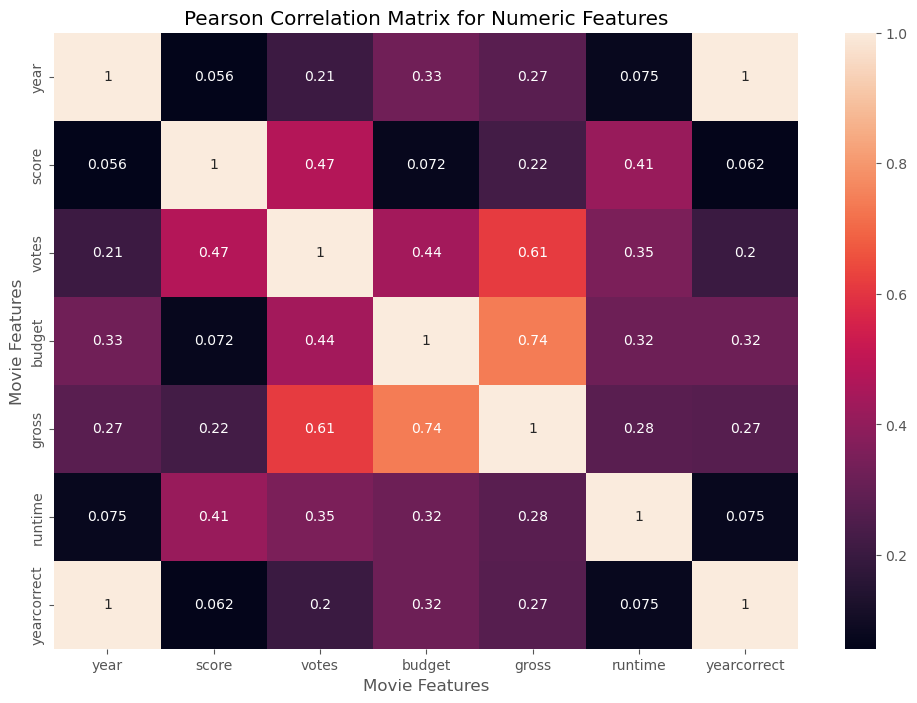

In [74]:
p_corr_matrix = df.corr()
sns.heatmap(p_corr_matrix, annot = True)

plt.title('Pearson Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()  #Brighter colors show higher correlation

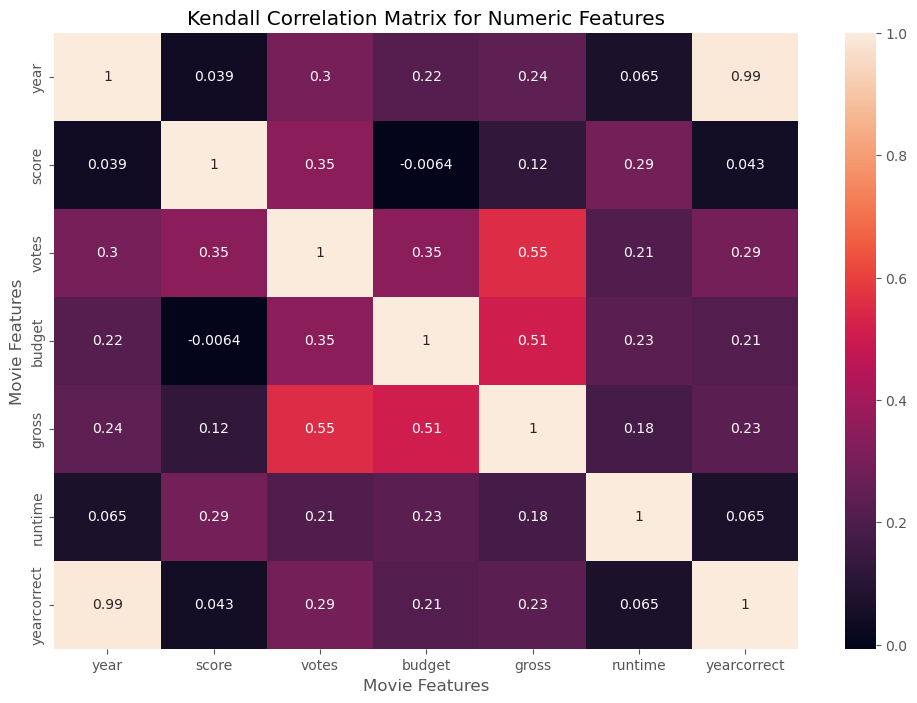

In [75]:
k_corr_matrix = df.corr(method = 'kendall')
sns.heatmap(k_corr_matrix, annot = True)

plt.title('Kendall Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

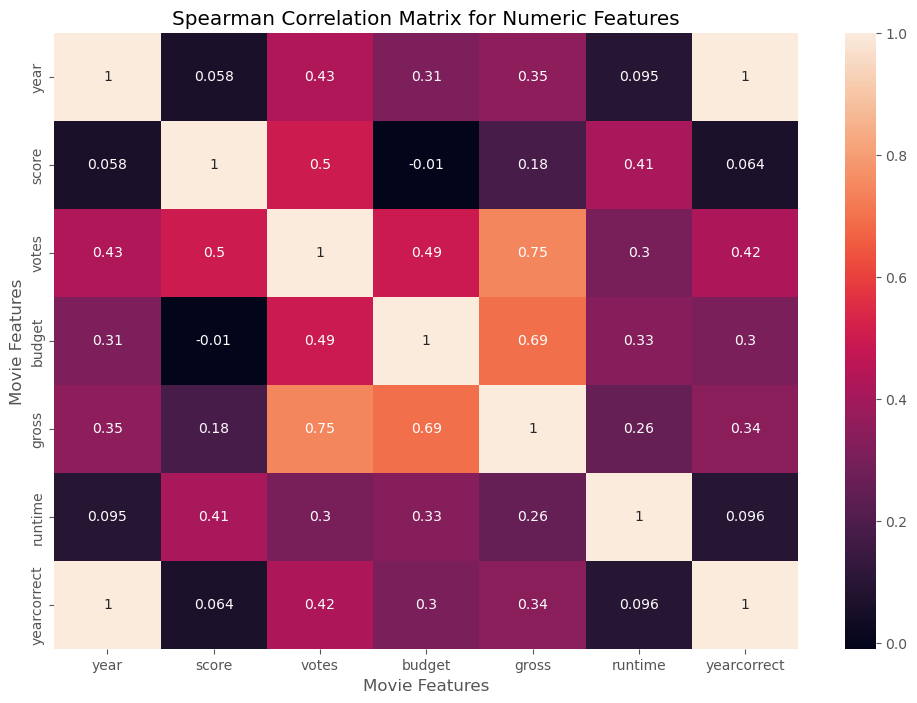

In [73]:
s_corr_matrix = df.corr(method = 'spearman')
sns.heatmap(s_corr_matrix, annot = True)

plt.title('Spearman Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [76]:
# We also want to look at Company

df_numerized = df

for col_name in df_numerized.columns:
    if(df_numerized[col_name].dtype == 'object'):
        df_numerized[col_name] = df_numerized[col_name].astype('category')
        df_numerized[col_name] = df_numerized[col_name].cat.codes

df_numerized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,386,5,0,2009,527,7.80,1100000,785,1263,1534,47,237000000,2847246203,1382,162.00,2009
7445,388,5,0,2019,137,8.40,903000,105,513,1470,47,356000000,2797501328,983,181.00,2019
3045,4909,5,6,1997,534,7.80,1100000,785,1263,1073,47,200000000,2201647264,1382,194.00,1997
6663,3643,5,0,2015,529,7.80,876000,768,1806,356,47,245000000,2069521700,945,138.00,2015
7244,389,5,0,2018,145,8.40,897000,105,513,1470,47,321000000,2048359754,983,149.00,2018
7480,4388,4,2,2019,1126,6.90,222000,1012,1361,457,47,260000000,1670727580,1423,118.00,2019
6653,2117,5,0,2015,1303,7.00,593000,335,2523,293,47,150000000,1670516444,1397,124.00,2015
6043,3878,5,0,2012,1899,8.00,1300000,1060,1646,1470,47,220000000,1518815515,983,143.00,2012
6646,1541,5,0,2015,165,7.10,370000,809,481,1785,47,190000000,1515341399,1397,137.00,2015
7494,1530,4,2,2019,2053,6.80,148000,277,1383,1036,47,150000000,1450026933,1422,103.00,2019


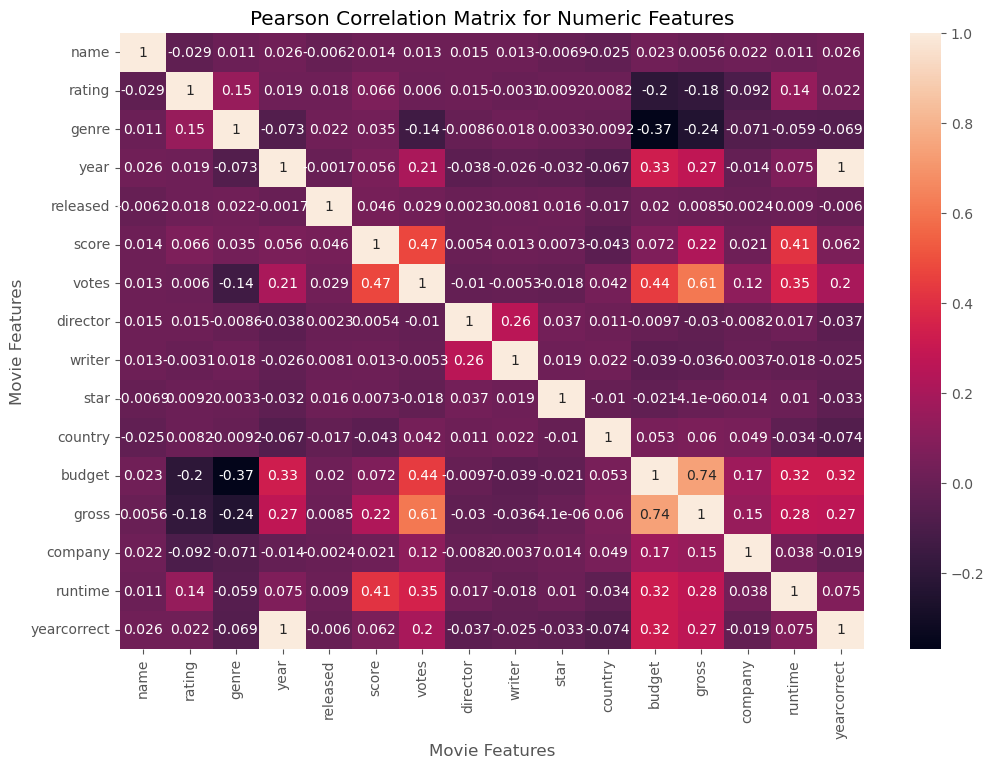

In [80]:
p_corr_matrix = df_numerized.corr()
sns.heatmap(p_corr_matrix, annot = True)

plt.title('Pearson Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

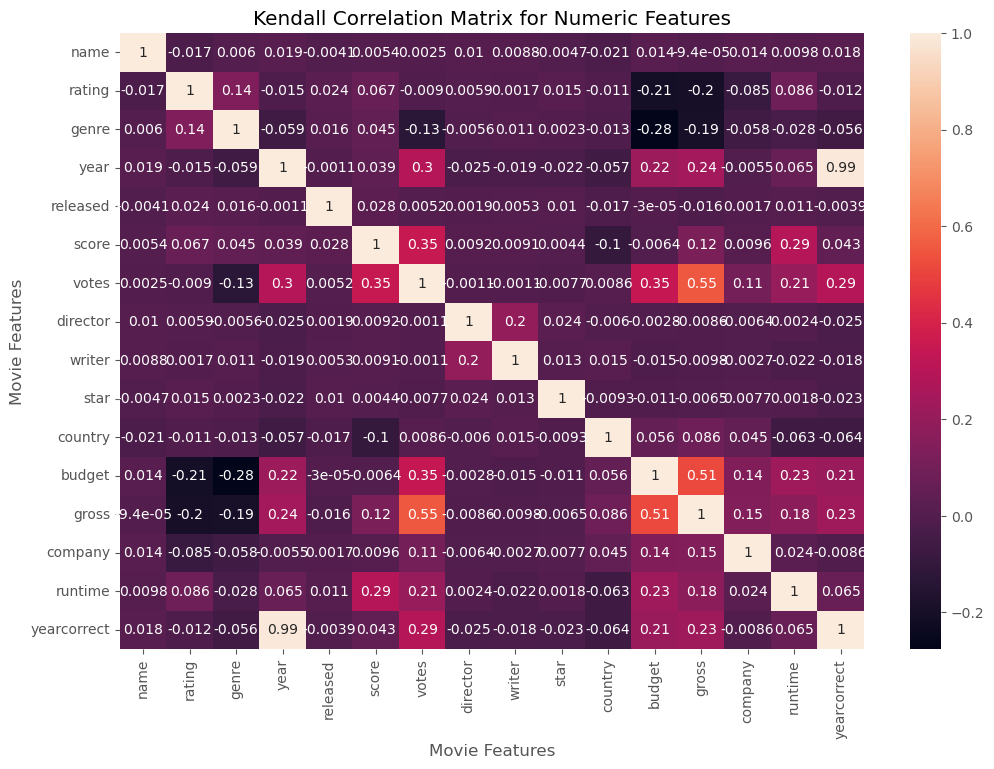

In [81]:
k_corr_matrix = df_numerized.corr(method = 'kendall')
sns.heatmap(k_corr_matrix, annot = True)

plt.title('Kendall Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

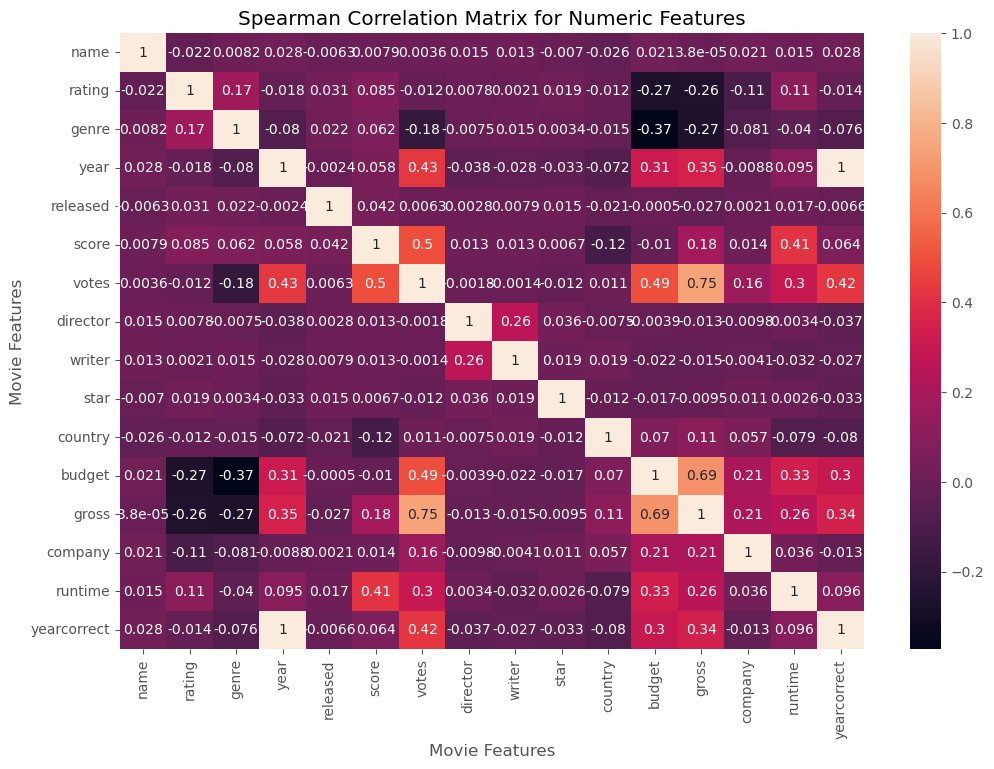

In [82]:
s_corr_matrix = df_numerized.corr(method = 'spearman')
sns.heatmap(s_corr_matrix, annot = True)

plt.title('Spearman Correlation Matrix for Numeric Features')
plt.xlabel('Movie Features')
plt.ylabel('Movie Features')
plt.show()

In [86]:
p_corr_mat = df_numerized.corr()
p_corr_pairs = p_corr_mat.unstack()
p_sorted_pairs = p_corr_pairs.sort_values()

In [87]:
p_corr_pairs

name         name           1.00
             rating        -0.03
             genre          0.01
             year           0.03
             released      -0.01
             score          0.01
             votes          0.01
             director       0.02
             writer         0.01
             star          -0.01
             country       -0.03
             budget         0.02
             gross          0.01
             company        0.02
             runtime        0.01
             yearcorrect    0.03
rating       name          -0.03
             rating         1.00
             genre          0.15
             year           0.02
             released       0.02
             score          0.07
             votes          0.01
             director       0.01
             writer        -0.00
             star           0.01
             country        0.01
             budget        -0.20
             gross         -0.18
             company       -0.09
          

In [88]:
p_sorted_pairs

genre        budget        -0.37
budget       genre         -0.37
gross        genre         -0.24
genre        gross         -0.24
rating       budget        -0.20
budget       rating        -0.20
rating       gross         -0.18
gross        rating        -0.18
votes        genre         -0.14
genre        votes         -0.14
company      rating        -0.09
rating       company       -0.09
country      yearcorrect   -0.07
yearcorrect  country       -0.07
year         genre         -0.07
genre        year          -0.07
             company       -0.07
company      genre         -0.07
genre        yearcorrect   -0.07
yearcorrect  genre         -0.07
year         country       -0.07
country      year          -0.07
genre        runtime       -0.06
runtime      genre         -0.06
score        country       -0.04
country      score         -0.04
writer       budget        -0.04
budget       writer        -0.04
year         director      -0.04
director     year          -0.04
          

In [93]:
p_high_corr = p_sorted_pairs[(p_sorted_pairs) > 0.5]

p_high_corr

gross        votes         0.61
votes        gross         0.61
gross        budget        0.74
budget       gross         0.74
year         yearcorrect   1.00
yearcorrect  year          1.00
name         name          1.00
company      company       1.00
gross        gross         1.00
budget       budget        1.00
country      country       1.00
star         star          1.00
writer       writer        1.00
director     director      1.00
votes        votes         1.00
score        score         1.00
released     released      1.00
year         year          1.00
genre        genre         1.00
rating       rating        1.00
runtime      runtime       1.00
yearcorrect  yearcorrect   1.00
dtype: float64